<a href="https://colab.research.google.com/github/srivatsan88/End-to-End-Time-Series-/blob/master/Timeseries_Data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [125]:
from __future__ import absolute_import, division, print_function, unicode_literals
import os
import seaborn as sns

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

import pandas as pd
import plotly.express as px


In [124]:
from download import download

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False


In [2]:
path = download(r"C:\Users\gagan\Downloads\PRSA2017_Data_20130301-20170228\PRSA_Data_20130301-20170228\PRSA_Data_Dingling_20130301-20170228.csv",
                '/tmp/aq',
                kind="zip")

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


In [4]:
df = pd.read_csv(r"C:\Users\gagan\Downloads\PRSA2017_Data_20130301-20170228\PRSA_Data_20130301-20170228\PRSA_Data_Dingling_20130301-20170228.csv", 
                 encoding='ISO-8859-1')

In [6]:
file_path = r"C:\Users\gagan\Downloads\PRSA2017_Data_20130301-20170228\PRSA_Data_20130301-20170228\PRSA_Data_Dingling_20130301-20170228.csv"
if os.path.exists(file_path):
    df = pd.read_csv(file_path, encoding='ISO-8859-1')
    print("Data loaded successfully!")
else:
    print("File does not exist.")


Data loaded successfully!


In [9]:
df

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,11.0,11.0,2.0,2.0,200.0,99.0,11.7,1008.9,-13.3,0.0,NNE,1.3,Dingling
35060,35061,2017,2,28,20,13.0,13.0,2.0,2.0,200.0,101.0,10.9,1009.0,-14.0,0.0,N,2.1,Dingling
35061,35062,2017,2,28,21,9.0,14.0,2.0,2.0,200.0,102.0,9.5,1009.4,-13.0,0.0,N,1.5,Dingling
35062,35063,2017,2,28,22,10.0,12.0,2.0,2.0,200.0,97.0,7.8,1009.6,-12.6,0.0,NW,1.4,Dingling


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [11]:
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d %H')

In [62]:
# Define the path to your CSV file
csv_file_path = r"C:\Users\gagan\Downloads\PRSA2017_Data_20130301-20170228\PRSA_Data_20130301-20170228\PRSA_Data_Dingling_20130301-20170228.csv"

# Read the CSV file and create a single datetime column
aq_df = pd.read_csv(csv_file_path)

# Combine the year, month, day, and hour into a single datetime column
aq_df['year_month_day_hour'] = pd.to_datetime(aq_df[['year', 'month', 'day', 'hour']])

# Optionally, drop the original date columns if no longer needed
aq_df = aq_df.drop(columns=['year', 'month', 'day', 'hour'])

In [33]:
aq_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [35]:
aq_df_.head()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [34]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [32]:
aq_df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   year                 35064 non-null  object        
 3   month                35064 non-null  object        
 4   day                  35064 non-null  object        
 5   hour                 35064 non-null  object        
 6   PM2.5                34285 non-null  float64       
 7   PM10                 34408 non-null  float64       
 8   SO2                  34334 non-null  float64       
 9   NO2                  33830 non-null  float64       
 10  CO                   33052 non-null  float64       
 11  O3                   33850 non-null  float64       
 12  TEMP                 35011 non-null  float64       
 13  PRES                 35014 non-

In [36]:
aq_df['month']=pd.to_numeric(aq_df['month'])

In [37]:
print ("Rows     : " ,aq_df.shape[0])
print ("Columns  : " ,aq_df.shape[1])
print ("\nFeatures : \n" ,aq_df.columns.tolist())
print ("\nMissing values :  ", aq_df.isnull().any())
print ("\nUnique values :  \n",aq_df.nunique())

Rows     :  35064
Columns  :  18

Features : 
 ['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station']

Missing values :   No         False
year       False
month      False
day        False
hour       False
PM2.5       True
PM10        True
SO2         True
NO2         True
CO          True
O3          True
TEMP        True
PRES        True
DEWP        True
RAIN        True
wd          True
WSPM        True
station    False
dtype: bool

Unique values :  
 No         35064
year           5
month         12
day           31
hour          24
PM2.5        486
PM10         554
SO2          327
NO2          636
CO           103
O3           792
TEMP         998
PRES         593
DEWP         602
RAIN         116
wd            16
WSPM          95
station        1
dtype: int64


In [38]:
aq_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


In [39]:
aq_df_non_indexed=aq_df.copy()

In [43]:
print(aq_df.columns)


Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')


In [44]:

aq_df = pd.read_csv(csv_file_path)

# Combine year, month, day, and hour into a single datetime column
aq_df['datetime'] = pd.to_datetime(aq_df[['year', 'month', 'day', 'hour']])

# Print the columns to check if 'datetime' was created
print(aq_df.columns)


Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime'],
      dtype='object')


In [45]:
aq_df = aq_df.set_index('datetime')


In [46]:
aq_df.index

DatetimeIndex(['2013-03-01 00:00:00', '2013-03-01 01:00:00',
               '2013-03-01 02:00:00', '2013-03-01 03:00:00',
               '2013-03-01 04:00:00', '2013-03-01 05:00:00',
               '2013-03-01 06:00:00', '2013-03-01 07:00:00',
               '2013-03-01 08:00:00', '2013-03-01 09:00:00',
               ...
               '2017-02-28 14:00:00', '2017-02-28 15:00:00',
               '2017-02-28 16:00:00', '2017-02-28 17:00:00',
               '2017-02-28 18:00:00', '2017-02-28 19:00:00',
               '2017-02-28 20:00:00', '2017-02-28 21:00:00',
               '2017-02-28 22:00:00', '2017-02-28 23:00:00'],
              dtype='datetime64[ns]', name='datetime', length=35064, freq=None)

In [47]:
aq_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
datetime,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [48]:
aq_df.loc['2013-03-01':'2013-03-05']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
datetime,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-03-05 19:00:00,116,2013,3,5,19,179.0,200.0,50.0,96.0,1600.0,82.0,7.7,1005.4,-7.6,0.0,NNE,0.2,Dingling
2013-03-05 20:00:00,117,2013,3,5,20,172.0,180.0,43.0,94.0,1899.0,82.0,6.3,1005.9,-7.3,0.0,NNE,0.7,Dingling
2013-03-05 21:00:00,118,2013,3,5,21,179.0,191.0,38.0,80.0,1700.0,82.0,5.6,1006.0,-7.3,0.0,NNE,0.2,Dingling


In [49]:
aq_df.loc['2013':'2015']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
datetime,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,24860,2015,12,31,19,85.0,95.0,12.0,73.0,1200.0,2.0,-0.6,1021.0,-9.5,0.0,NE,0.6,Dingling
2015-12-31 20:00:00,24861,2015,12,31,20,NaN,109.0,32.0,79.0,2900.0,2.0,-1.8,1021.2,-9.9,0.0,NW,1.1,Dingling
2015-12-31 21:00:00,24862,2015,12,31,21,80.0,100.0,35.0,81.0,3200.0,2.0,-1.6,1020.8,-9.7,0.0,NE,0.9,Dingling


In [50]:
pm_data = aq_df['PM2.5']
pm_data.head()

datetime
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
2013-03-01 02:00:00    5.0
2013-03-01 03:00:00    6.0
2013-03-01 04:00:00    5.0
Name: PM2.5, dtype: float64

<Axes: xlabel='datetime'>

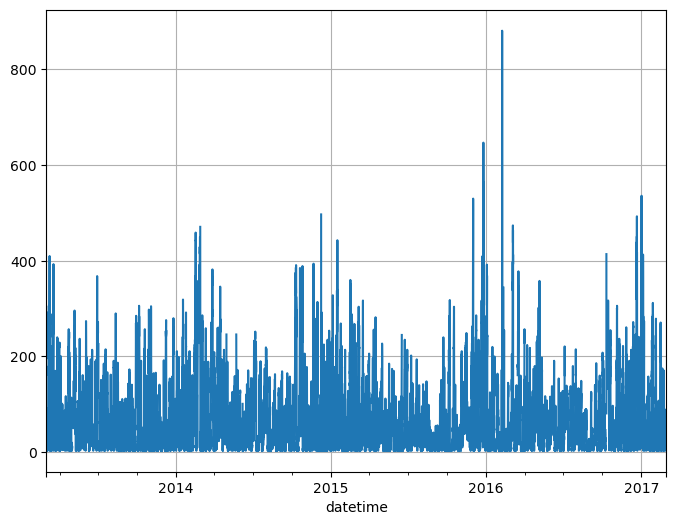

In [51]:
pm_data.plot(grid=True)

<Axes: xlabel='datetime'>

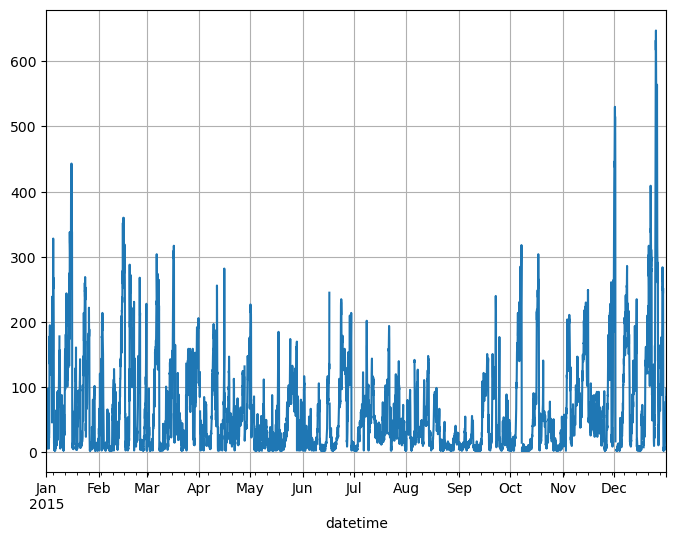

In [52]:
aq_df_2015=aq_df.loc['2015']
pm_data_2015=aq_df_2015['PM2.5']
pm_data_2015.plot(grid=True)

<Axes: xlabel='datetime'>

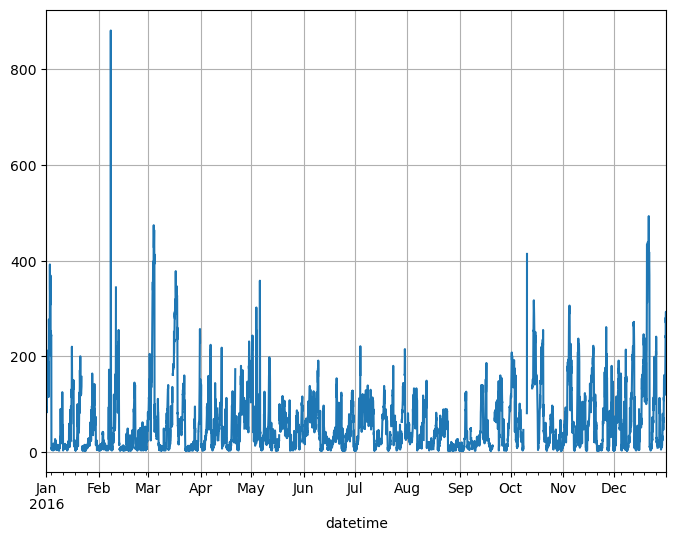

In [54]:
aq_df_2016 = aq_df.loc['2016']
pm_data_2016 = aq_df_2016['PM2.5']
pm_data_2016.plot(grid=True)


In [59]:
fig = px.line(aq_df, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()


C:\Users\gagan\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [60]:
# Ensure the datetime column is in the correct format
aq_df['year_month_day_hour'] = aq_df['year_month_day_hour'].dt.to_pydatetime()

# Create the line plot
fig = px.line(aq_df, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()


C:\Users\gagan\AppData\Local\Temp\ipykernel_19384\3640659293.py:4: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\gagan\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [64]:
print(aq_df_non_indexed.columns)


Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')


In [65]:
# Combine year, month, day, and hour into a single datetime column
aq_df_non_indexed['year_month_day_hour'] = pd.to_datetime(
    aq_df_non_indexed[['year', 'month', 'day', 'hour']]
)


In [66]:
fig = px.line(aq_df_non_indexed, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

C:\Users\gagan\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [69]:
print(aq_df.columns)

Index(['No', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'wd', 'WSPM', 'station', 'year_month_day_hour'],
      dtype='object')


In [71]:

aq_df['year_month_day_hour'] = pd.to_datetime(aq_df['year_month_day_hour'])

# Extract the year into a new column
aq_df['year'] = aq_df['year_month_day_hour'].dt.year

# Filter for years 2014 to 2016
df_filtered = aq_df[(aq_df['year'] >= 2014) & (aq_df['year'] <= 2016)].reset_index(drop=True)

# Display the first few rows to verify
print(df_filtered.head())

# If you need to create month_day_hour, you can do it as follows
df_filtered['month_day_hour'] = df_filtered['year_month_day_hour'].dt.strftime('%m-%d %H')

# Display the filtered DataFrame
print(df_filtered)

     No  PM2.5   PM10   SO2   NO2     CO    O3  TEMP    PRES  DEWP  RAIN   wd  \
0  7345   27.0  104.0  12.0   9.0    NaN   NaN   6.8  1003.7 -15.9   0.0  WSW   
1  7346   25.0   86.0  12.0   9.0  500.0  63.0   6.5  1003.6 -16.2   0.0    W   
2  7347   27.0   85.0  14.0   9.0  400.0  63.0   6.4  1003.4 -15.6   0.0  WNW   
3  7348   34.0   98.0  19.0  15.0  400.0  56.0   6.2  1002.9 -15.8   0.0  WNW   
4  7349   32.0  102.0  18.0  15.0  400.0  33.0   6.1  1002.7 -15.2   0.0    W   

   WSPM   station year_month_day_hour  year  
0   5.2  Dingling 2014-01-01 00:00:00  2014  
1   3.6  Dingling 2014-01-01 01:00:00  2014  
2   5.3  Dingling 2014-01-01 02:00:00  2014  
3   4.7  Dingling 2014-01-01 03:00:00  2014  
4   3.5  Dingling 2014-01-01 04:00:00  2014  
          No  PM2.5   PM10   SO2    NO2      CO    O3  TEMP    PRES  DEWP  \
0       7345   27.0  104.0  12.0    9.0     NaN   NaN   6.8  1003.7 -15.9   
1       7346   25.0   86.0  12.0    9.0   500.0  63.0   6.5  1003.6 -16.2   
2     

In [73]:
# Ensure 'year_month_day_hour' is a datetime type
aq_df['year_month_day_hour'] = pd.to_datetime(aq_df['year_month_day_hour'])

# Extract the year from the datetime column
aq_df['year'] = aq_df['year_month_day_hour'].dt.year

# Filter for specific years
df_2014 = aq_df[aq_df['year'] == 2014].reset_index(drop=True)
df_2015 = aq_df[aq_df['year'] == 2015].reset_index(drop=True)
df_2016 = aq_df[aq_df['year'] == 2016].reset_index(drop=True)

# Create a month_day_hour column if needed
df_2014['month_day_hour'] = df_2014['year_month_day_hour'].dt.strftime('%m-%d %H')
df_2015['month_day_hour'] = df_2015['year_month_day_hour'].dt.strftime('%m-%d %H')
df_2016['month_day_hour'] = df_2016['year_month_day_hour'].dt.strftime('%m-%d %H')

# Display the filtered DataFrames
print("2014 DataFrame:")
print(df_2014.head())
print("\n2015 DataFrame:")
print(df_2015.head())
print("\n2016 DataFrame:")
print(df_2016.head())


2014 DataFrame:
     No  PM2.5   PM10   SO2   NO2     CO    O3  TEMP    PRES  DEWP  RAIN   wd  \
0  7345   27.0  104.0  12.0   9.0    NaN   NaN   6.8  1003.7 -15.9   0.0  WSW   
1  7346   25.0   86.0  12.0   9.0  500.0  63.0   6.5  1003.6 -16.2   0.0    W   
2  7347   27.0   85.0  14.0   9.0  400.0  63.0   6.4  1003.4 -15.6   0.0  WNW   
3  7348   34.0   98.0  19.0  15.0  400.0  56.0   6.2  1002.9 -15.8   0.0  WNW   
4  7349   32.0  102.0  18.0  15.0  400.0  33.0   6.1  1002.7 -15.2   0.0    W   

   WSPM   station year_month_day_hour  year month_day_hour  
0   5.2  Dingling 2014-01-01 00:00:00  2014       01-01 00  
1   3.6  Dingling 2014-01-01 01:00:00  2014       01-01 01  
2   5.3  Dingling 2014-01-01 02:00:00  2014       01-01 02  
3   4.7  Dingling 2014-01-01 03:00:00  2014       01-01 03  
4   3.5  Dingling 2014-01-01 04:00:00  2014       01-01 04  

2015 DataFrame:
      No  PM2.5  PM10  SO2  NO2  CO  O3  TEMP    PRES  DEWP  RAIN   wd  WSPM  \
0  16105    NaN   NaN  NaN  NaN Na

In [76]:
# Ensure 'year_month_day_hour' is a datetime type
aq_df['year_month_day_hour'] = pd.to_datetime(aq_df['year_month_day_hour'])

# Extract the year from the datetime column
aq_df['year'] = aq_df['year_month_day_hour'].dt.year

# Filter for specific years
df_2014 = aq_df[aq_df['year'] == 2014].reset_index(drop=True)
df_2015 = aq_df[aq_df['year'] == 2015].reset_index(drop=True)
df_2016 = aq_df[aq_df['year'] == 2016].reset_index(drop=True)

# Create a month_day_hour column if needed
df_2014['month_day_hour'] = df_2014['year_month_day_hour'].dt.strftime('%m-%d %H')
df_2015['month_day_hour'] = df_2015['year_month_day_hour'].dt.strftime('%m-%d %H')
df_2016['month_day_hour'] = df_2016['year_month_day_hour'].dt.strftime('%m-%d %H')

# Display the filtered DataFrames
print("2014 DataFrame:")
print(df_2014.head())
print("\n2015 DataFrame:")
print(df_2015.head())
print("\n2016 DataFrame:")
print(df_2016.head())


2014 DataFrame:
     No  PM2.5   PM10   SO2   NO2     CO    O3  TEMP    PRES  DEWP  RAIN   wd  \
0  7345   27.0  104.0  12.0   9.0    NaN   NaN   6.8  1003.7 -15.9   0.0  WSW   
1  7346   25.0   86.0  12.0   9.0  500.0  63.0   6.5  1003.6 -16.2   0.0    W   
2  7347   27.0   85.0  14.0   9.0  400.0  63.0   6.4  1003.4 -15.6   0.0  WNW   
3  7348   34.0   98.0  19.0  15.0  400.0  56.0   6.2  1002.9 -15.8   0.0  WNW   
4  7349   32.0  102.0  18.0  15.0  400.0  33.0   6.1  1002.7 -15.2   0.0    W   

   WSPM   station year_month_day_hour  year month_day_hour  
0   5.2  Dingling 2014-01-01 00:00:00  2014       01-01 00  
1   3.6  Dingling 2014-01-01 01:00:00  2014       01-01 01  
2   5.3  Dingling 2014-01-01 02:00:00  2014       01-01 02  
3   4.7  Dingling 2014-01-01 03:00:00  2014       01-01 03  
4   3.5  Dingling 2014-01-01 04:00:00  2014       01-01 04  

2015 DataFrame:
      No  PM2.5  PM10  SO2  NO2  CO  O3  TEMP    PRES  DEWP  RAIN   wd  WSPM  \
0  16105    NaN   NaN  NaN  NaN Na

C:\Users\gagan\AppData\Local\Temp\ipykernel_19384\3688338002.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gagan\AppData\Local\Temp\ipykernel_19384\3688338002.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



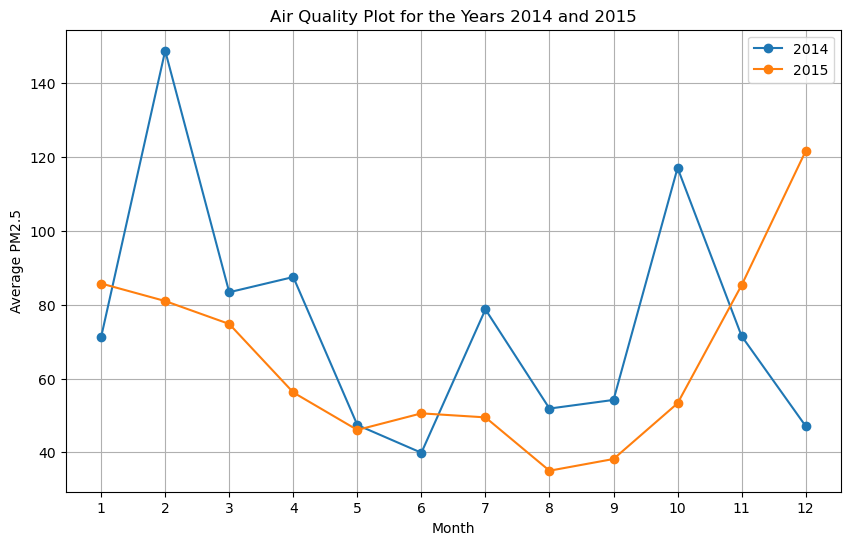

In [78]:
df_2014 = aq_df[aq_df['year'] == 2014]
df_2015 = aq_df[aq_df['year'] == 2015]

# Extracting month and PM2.5 values
df_2014['month'] = df_2014['year_month_day_hour'].dt.month
df_2015['month'] = df_2015['year_month_day_hour'].dt.month

# Group by month and calculate mean PM2.5 for each month
monthly_avg_2014 = df_2014.groupby('month')['PM2.5'].mean()
monthly_avg_2015 = df_2015.groupby('month')['PM2.5'].mean()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(monthly_avg_2014.index, monthly_avg_2014.values, label='2014', marker='o')
plt.plot(monthly_avg_2015.index, monthly_avg_2015.values, label='2015', marker='o')

# Adding legend and labels
plt.legend(['2014', '2015'])
plt.xlabel('Month')
plt.ylabel('Average PM2.5')
plt.title('Air Quality Plot for the Years 2014 and 2015')
plt.xticks(monthly_avg_2014.index)  # Set x-ticks to be months
plt.grid(True)
plt.show()

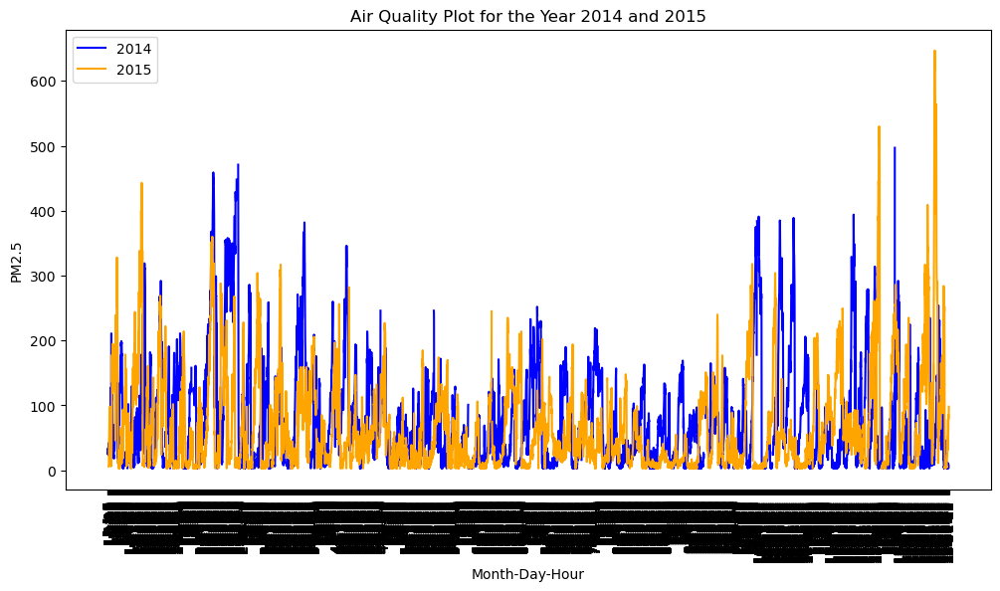

In [81]:
aq_df['datetime'] = pd.to_datetime(aq_df['year_month_day_hour'], format='%Y-%m-%d %H:%M:%S')

# Extract month, day, and hour
aq_df['month'] = aq_df['datetime'].dt.month
aq_df['day'] = aq_df['datetime'].dt.day
aq_df['hour'] = aq_df['datetime'].dt.hour

# Now filter by year
df_2014 = aq_df[aq_df['year'] == 2014].reset_index()
df_2015 = aq_df[aq_df['year'] == 2015].reset_index()

# Create 'month_day_hour' column for both years
df_2014['month_day_hour'] = df_2014.apply(lambda x: f"{x['month']}-{x['day']}-{x['hour']}", axis=1)
df_2015['month_day_hour'] = df_2015.apply(lambda x: f"{x['month']}-{x['day']}-{x['hour']}", axis=1)

# Plot PM2.5 values for both years
plt.figure(figsize=(12, 6))
plt.plot(df_2014['month_day_hour'], df_2014['PM2.5'], label='2014', color='blue')
plt.plot(df_2015['month_day_hour'], df_2015['PM2.5'], label='2015', color='orange')

# Add labels and title
plt.legend()
plt.xlabel('Month-Day-Hour')
plt.ylabel('PM2.5')
plt.title('Air Quality Plot for the Year 2014 and 2015')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Display the plot
plt.show()

In [84]:
# Filter rows where the year is between 2014 and 2016
df_filtered = aq_df[(aq_df['year'] >= 2014) & (aq_df['year'] <= 2016)]

# Group by 'month' and use describe to get summary statistics for PM2.5
pm25_stats = df_filtered.groupby('month')['PM2.5'].describe()

# Display the result
print(pm25_stats)


        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0


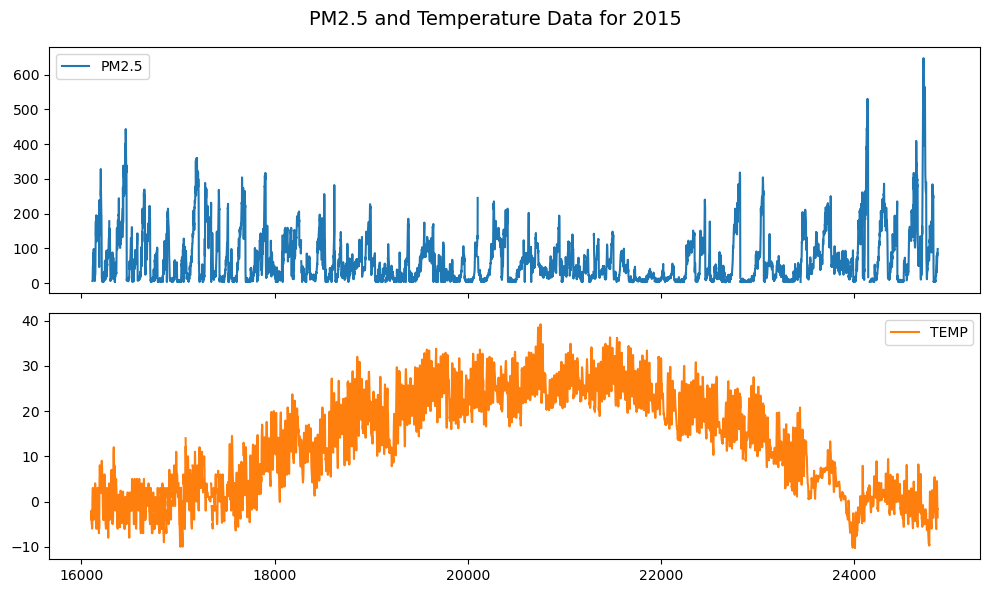

In [86]:
# Filter data for the year 2015
aq_df_2015 = aq_df[aq_df['year'] == 2015]

# Select 'PM2.5' and 'TEMP' columns for plotting
pm_data_2015 = aq_df_2015[['PM2.5', 'TEMP']]

# Create the subplots
pm_data_2015.plot(subplots=True, layout=(2, 1), figsize=(10, 6), title='PM2.5 and TEMP Data for 2015')

# Add labels and title for the plots
plt.suptitle('PM2.5 and Temperature Data for 2015', fontsize=14)

# Display the plot
plt.tight_layout()
plt.show()


https://weather.com/en-IN/india/science/news/2018-10-30-why-do-pollution-levels-skyrocket-during-winter

array([[<Axes: title={'center': 'PM2.5'}>,
        <Axes: title={'center': 'TEMP'}>]], dtype=object)

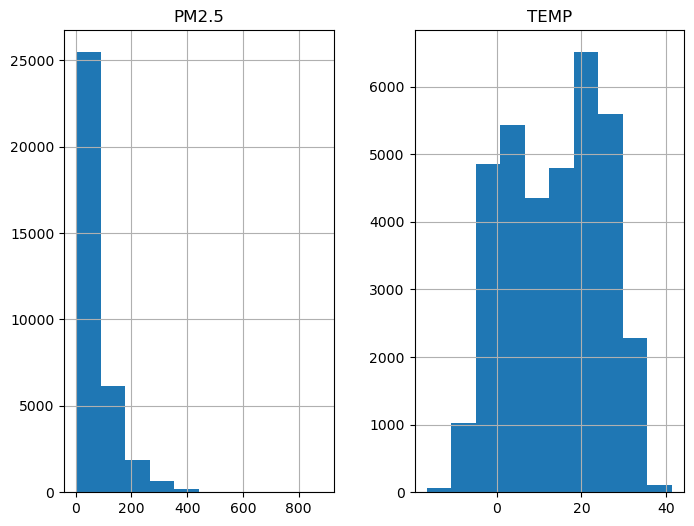

In [87]:
aq_df[['PM2.5','TEMP']].hist()

<Axes: ylabel='Density'>

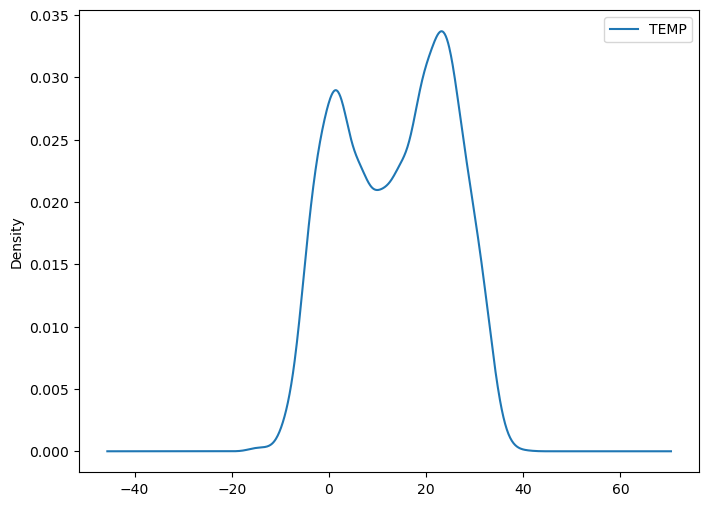

In [88]:
aq_df[['TEMP']].plot(kind='density')

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

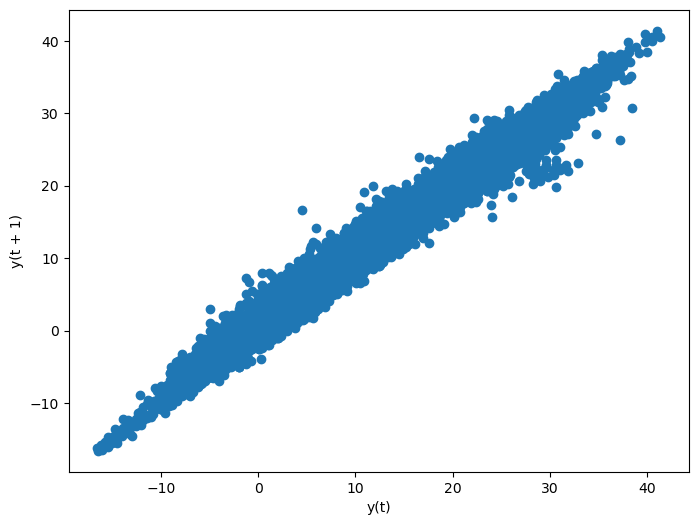

In [89]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 10)'>

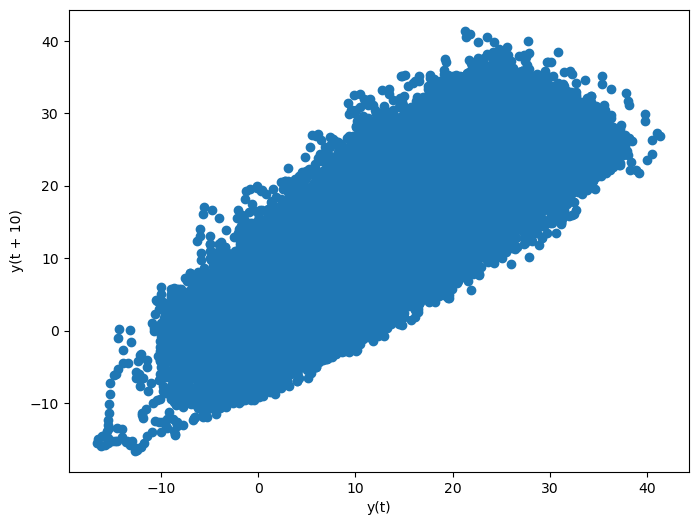

In [90]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=10)

<Axes: xlabel='y(t)', ylabel='y(t + 24)'>

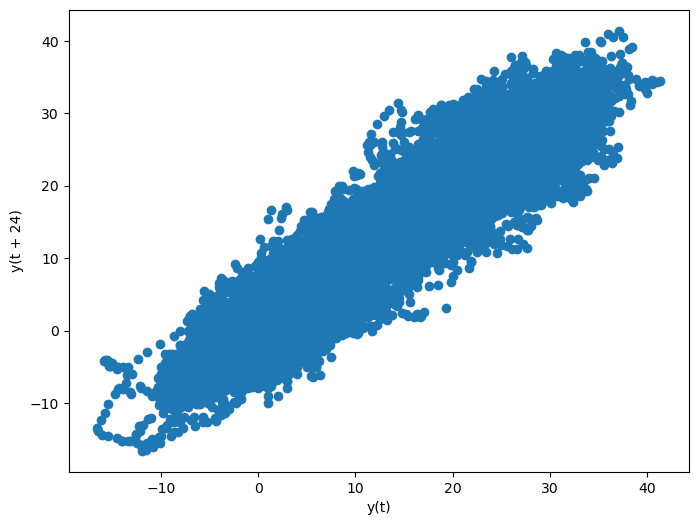

In [91]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=24)

<Axes: xlabel='y(t)', ylabel='y(t + 8640)'>

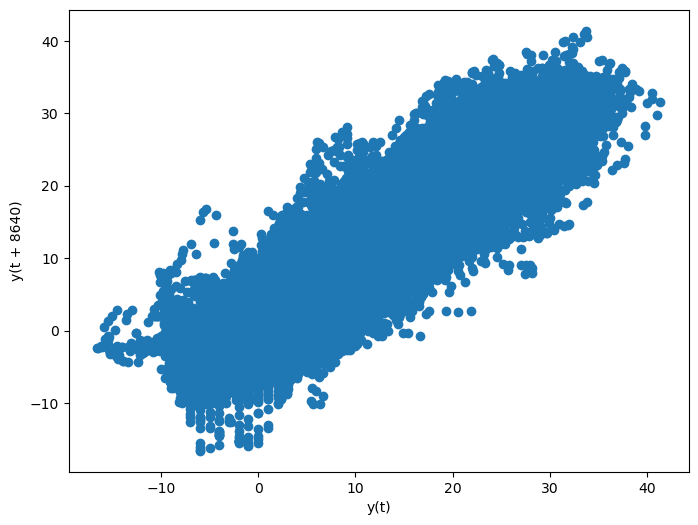

In [92]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=8640)

<Axes: xlabel='y(t)', ylabel='y(t + 4320)'>

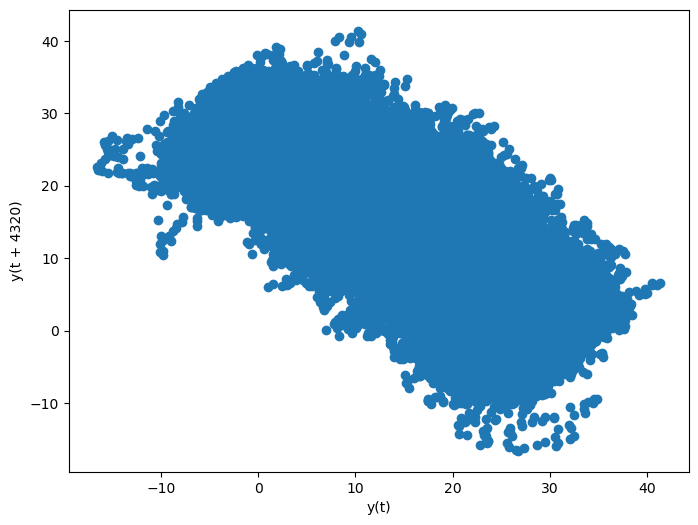

In [93]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=4320)

<Axes: xlabel='y(t)', ylabel='y(t + 2150)'>

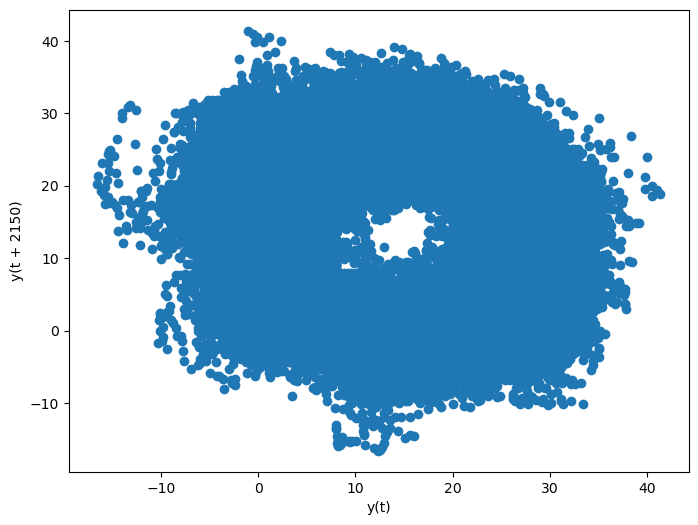

In [94]:
pd.plotting.lag_plot(aq_df['TEMP'],lag=2150)

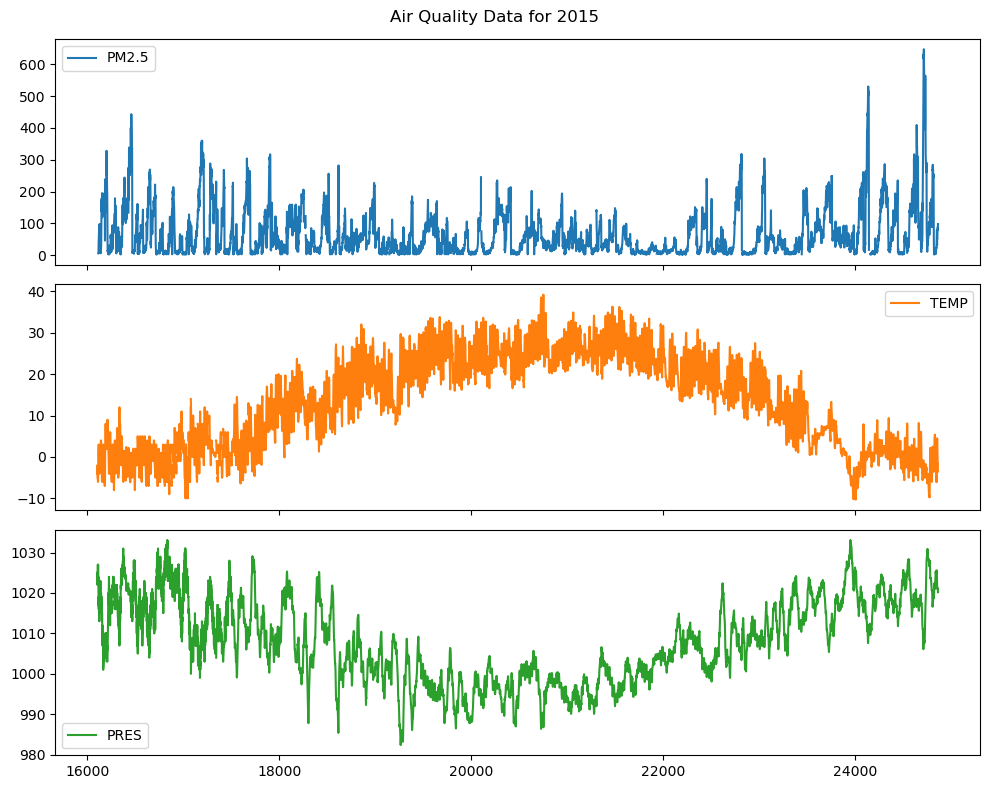

In [96]:
# Filter the dataset for the year 2015
aq_df_2015 = aq_df[aq_df['year'] == 2015]

# Select the columns PM2.5, TEMP, and PRES
pm_data_2015 = aq_df_2015[['PM2.5', 'TEMP', 'PRES']]

# Plotting the data with subplots
pm_data_2015.plot(subplots=True, figsize=(10, 8), title="Air Quality Data for 2015")
plt.tight_layout()
plt.show()


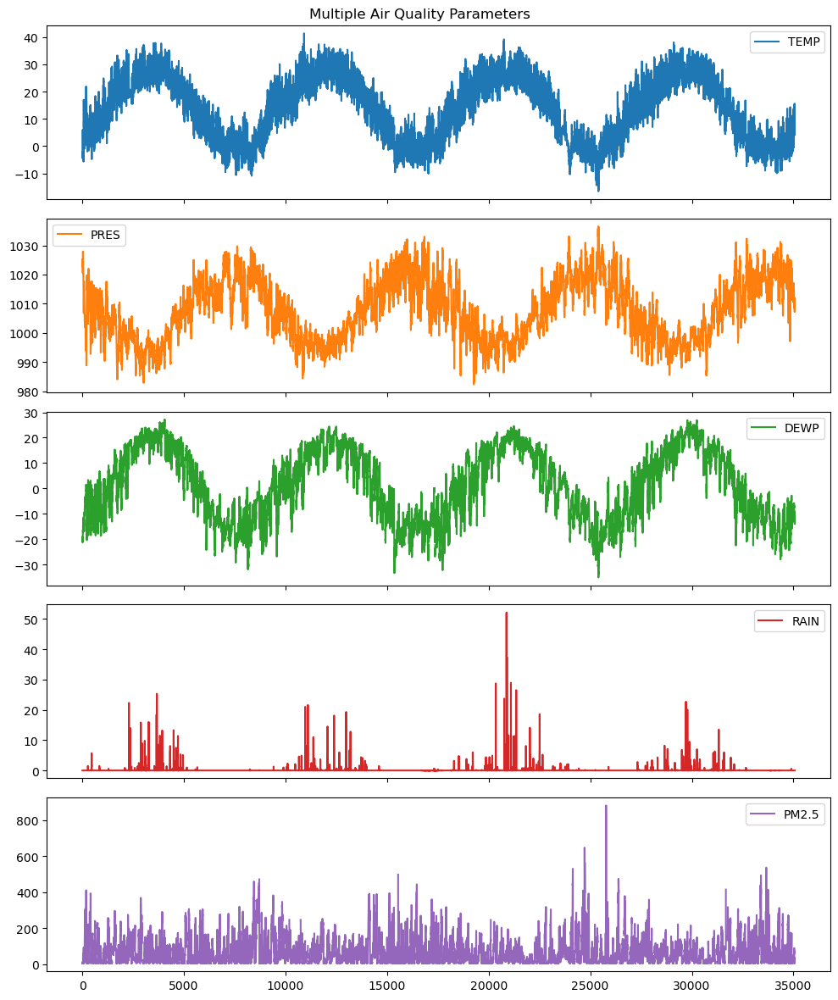

In [97]:
# Select the columns TEMP, PRES, DEWP, RAIN, and PM2.5
multi_data = aq_df[['TEMP', 'PRES', 'DEWP', 'RAIN', 'PM2.5']]

# Plotting the data with subplots
multi_data.plot(subplots=True, figsize=(10, 12), title="Multiple Air Quality Parameters")
plt.tight_layout()  # Ensures there's no overlap between plots
plt.show()


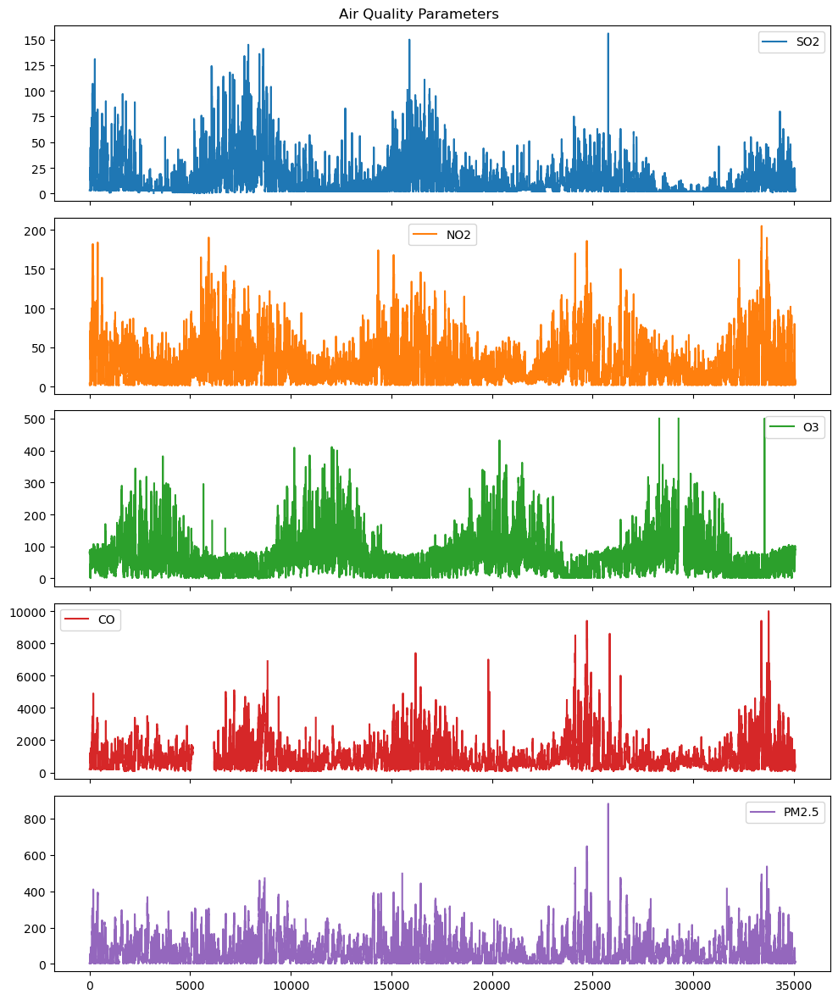

In [98]:
# Select the relevant columns
multi_data = aq_df[['SO2', 'NO2', 'O3', 'CO', 'PM2.5']]

# Plotting the data with subplots
multi_data.plot(subplots=True, figsize=(10, 12), title="Air Quality Parameters")
plt.tight_layout()  # Ensures there's no overlap between plots
plt.show()

In [104]:
# Select the data for the years 2014 to 2015
data_to_plot = aq_df['2014':'2015'][['PM2.5', 'O3']]

# Check if the DataFrame is empty
if data_to_plot.empty:
    print("No data available for the selected date range.")
else:
    # Plotting
    data_to_plot.plot(figsize=(15, 8), linewidth=3, fontsize=15)
    plt.xlabel('Year_Month_Day_Hour', fontsize=20)
    plt.ylabel('Concentration', fontsize=20)
    plt.title('PM2.5 and O3 Concentrations (2014-2015)', fontsize=20)
    plt.legend(['PM2.5', 'O3'], fontsize=15)
    plt.grid()
    plt.show()

No data available for the selected date range.


In [106]:
# Plot data for 2014 and 2015 
data_to_plot = aq_df['2014':'2015'][['PM2.5', 'O3']]
if not data_to_plot.empty:
    data_to_plot.plot(figsize=(15, 8), linewidth=3, fontsize=15)
    plt.xlabel('Date', fontsize=20)
    plt.ylabel('Concentration', fontsize=20)
    plt.title('PM2.5 and O3 Concentrations from 2014 to 2015', fontsize=20)
    plt.legend(['PM2.5', 'O3'], fontsize=15)
    plt.grid()
    plt.show()
else:
    print("No data available for the selected date range.")


No data available for the selected date range.


In [105]:
aq_df_2015['PM2.5']

16104     NaN
16105     NaN
16106     NaN
16107     NaN
16108     NaN
         ... 
24859    85.0
24860     NaN
24861    80.0
24862    93.0
24863    98.0
Name: PM2.5, Length: 8760, dtype: float64

In [109]:
aq_df_2015

,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,year_month_day_hour,year,datetime,month,day,hour
16104,16105,NaN,NaN,NaN,NaN,NaN,NaN,-4.0,1025.0,-23.7,0.0,NW,3.3,Dingling,2015-01-01 00:00:00,2015,2015-01-01 00:00:00,1,1,0
16105,16106,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,1022.0,-22.6,0.0,NNE,1.2,Dingling,2015-01-01 01:00:00,2015,2015-01-01 01:00:00,1,1,1
16106,16107,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1022.0,-23.5,0.0,NNW,1.7,Dingling,2015-01-01 02:00:00,2015,2015-01-01 02:00:00,1,1,2
16107,16108,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1023.0,-23.5,0.0,N,1.7,Dingling,2015-01-01 03:00:00,2015,2015-01-01 03:00:00,1,1,3
16108,16109,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1024.0,-24.0,0.0,NE,1.8,Dingling,2015-01-01 04:00:00,2015,2015-01-01 04:00:00,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24859,24860,85.0,95.0,12.0,73.0,1200.0,2.0,-0.6,1021.0,-9.5,0.0,NE,0.6,Dingling,2015-12-31 19:00:00,2015,2015-12-31 19:00:00,12,31,19
24860,24861,NaN,109.0,32.0,79.0,2900.0,2.0,-1.8,1021.2,-9.9,0.0,NW,1.1,Dingling,2015-12-31 20:00:00,2015,2015-12-31 20:00:00,12,31,20
24861,24862,80.0,100.0,35.0,81.0,3200.0,2.0,-1.6,1020.8,-9.7,0.0,NE,0.9,Dingling,2015-12-31 21:00:00,2015,2015-12-31 21:00:00,12,31,21
24862,24863,93.0,93.0,28.0,76.0,3500.0,2.0,-2.9,1020.4,-9.8,0.0,NNW,1.3,Dingling,2015-12-31 22:00:00,2015,2015-12-31 22:00:00,12,31,22


In [110]:
aq_df.isnull().values.any()

True

In [111]:
aq_df.isnull().any()

No                     False
PM2.5                   True
PM10                    True
SO2                     True
NO2                     True
CO                      True
O3                      True
TEMP                    True
PRES                    True
DEWP                    True
RAIN                    True
wd                      True
WSPM                    True
station                False
year_month_day_hour    False
year                   False
datetime               False
month                  False
day                    False
hour                   False
dtype: bool

In [112]:
df.isnull().sum()

No            0
year          0
month         0
day           0
hour          0
PM2.5       779
PM10        656
SO2         730
NO2        1234
CO         2012
O3         1214
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd          140
WSPM         43
station       0
dtype: int64

C:\Users\gagan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\gagan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\gagan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\gagan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\gagan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

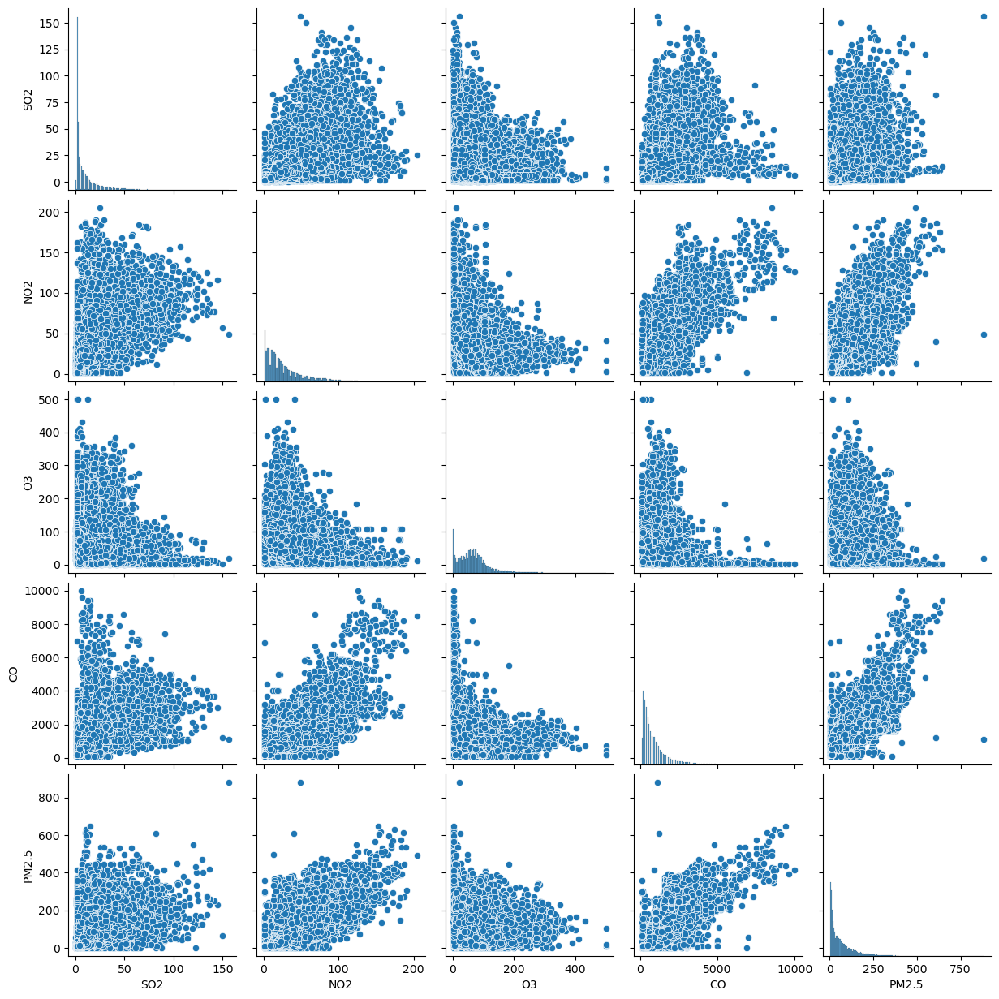

In [113]:
g = sns.pairplot(aq_df[['SO2','NO2','O3', 'CO','PM2.5']])

In [114]:
aq_corr=aq_df[['SO2','NO2','O3', 'CO','PM2.5']].corr(method='pearson')
aq_corr

,SO2,NO2,O3,CO,PM2.5
SO2,1.000000,0.610433,-0.182096,0.529182,0.475117
NO2,0.610433,1.000000,-0.373625,0.798753,0.718170
O3,-0.182096,-0.373625,1.000000,-0.303275,-0.100542
CO,0.529182,0.798753,-0.303275,1.000000,0.802737
PM2.5,0.475117,0.718170,-0.100542,0.802737,1.000000


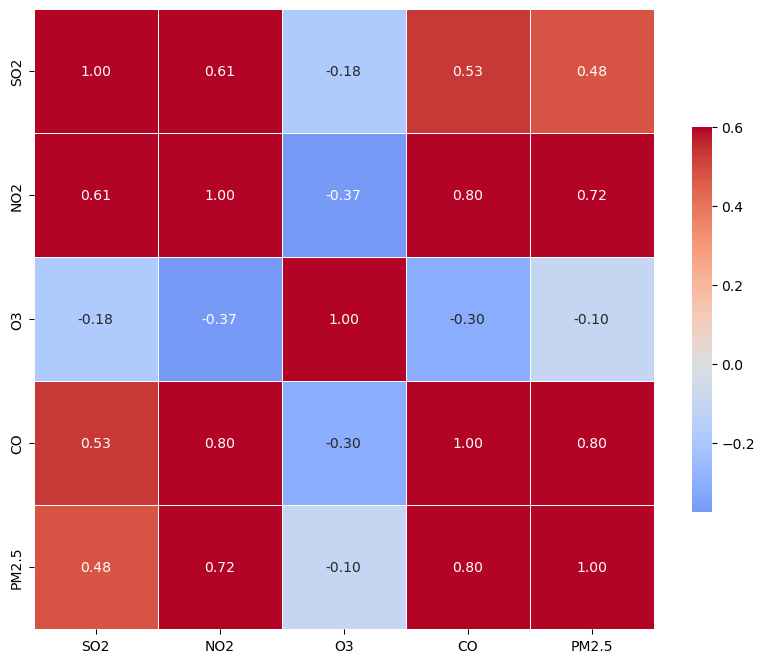

In [115]:
g = sns.heatmap(aq_corr,  vmax=.6, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.figure.set_size_inches(10,10)
    
plt.show()

In [116]:
aq_df.groupby('wd').agg(median=('PM2.5','median'),mean=('PM2.5','mean'),max=('PM2.5','max'), min=('PM2.5','min')).reset_index()

,wd,median,mean,max,min
0,E,70.0,88.623363,434.0,3.0
1,ENE,56.5,77.685514,647.0,3.0
2,ESE,78.5,96.492276,632.0,3.0
3,N,29.0,57.546221,536.0,3.0
4,NE,32.0,57.390083,530.0,3.0
5,NNE,26.0,53.946239,881.0,3.0
6,NNW,33.0,62.790775,548.0,3.0
7,NW,21.0,52.769116,535.0,3.0
8,S,52.0,72.497281,511.0,3.0
9,SE,70.0,85.045709,617.0,3.0


In [117]:
aq_df_na = aq_df.copy()
aq_df_na=aq_df_na.dropna()

In [119]:
aq_df_na['datetime'] = pd.to_datetime(aq_df_na['datetime'])
aq_df_na.set_index('datetime', inplace=True)

# Verify the data
print(aq_df_na.head())

                     No  PM2.5  PM10  SO2  NO2     CO    O3  TEMP    PRES  \
datetime                                                                    
2013-03-01 02:00:00   3    5.0   5.0  3.0  2.0  200.0  79.0  -3.0  1021.3   
2013-03-01 05:00:00   6    6.0   6.0  3.0  4.0  200.0  79.0  -4.5  1022.6   
2013-03-01 06:00:00   7    5.0  10.0  3.0  4.0  200.0  77.0  -4.5  1023.4   
2013-03-01 07:00:00   8    5.0   6.0  3.0  2.0  200.0  80.0  -2.1  1024.6   
2013-03-01 08:00:00   9    8.0   7.0  3.0  3.0  200.0  79.0  -0.2  1025.2   

                     DEWP  RAIN   wd  WSPM   station year_month_day_hour  \
datetime                                                                   
2013-03-01 02:00:00 -19.9   0.0  ENE   0.2  Dingling 2013-03-01 02:00:00   
2013-03-01 05:00:00 -19.5   0.0  NNW   1.7  Dingling 2013-03-01 05:00:00   
2013-03-01 06:00:00 -19.5   0.0  NNW   1.8  Dingling 2013-03-01 06:00:00   
2013-03-01 07:00:00 -20.0   0.0   NW   2.5  Dingling 2013-03-01 07:00:00   
2013

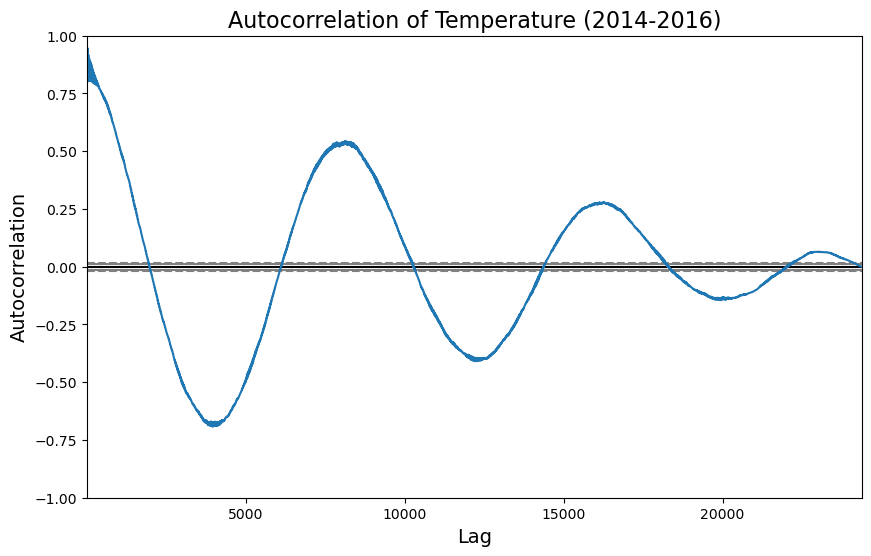

In [120]:
# Plot autocorrelation for TEMP from 2014 to 2016
plt.figure(figsize=(10, 6))
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'])
plt.title('Autocorrelation of Temperature (2014-2016)', fontsize=16)
plt.xlabel('Lag', fontsize=14)
plt.ylabel('Autocorrelation', fontsize=14)
plt.grid()
plt.show()

In [121]:
aq_df_na['TEMP'].resample("1m").mean()

datetime
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839216
2016-08

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

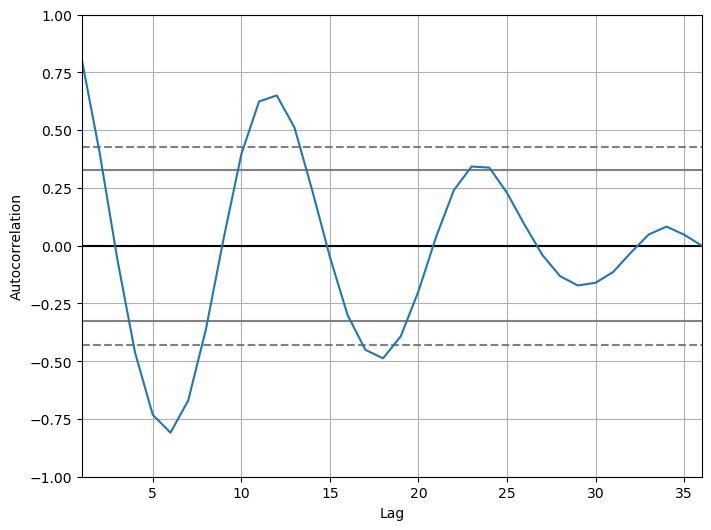

In [122]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'].resample("1m").mean())

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

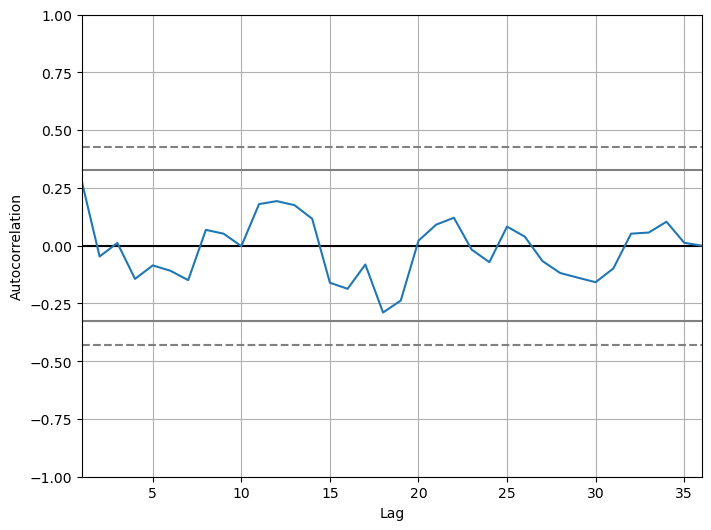

In [123]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['PM2.5'].resample("1m").mean())